In [19]:
import os
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo

pyo.init_notebook_mode()

In [28]:
from glob2 import glob

root = "/media/nick/hdd02/Cole Trapnell's Lab Dropbox/Nick Lammers/Nick/morphseq/"
train_name = "20240509_ds"
model_name = "SeqVAE_z100_ne250_gdf3_lmx_temp22" #"SeqVAE_z100_ne250_all_temp22"#"SeqVAE_z100_ne250_all_temp15"
# training_name = "SeqVAE_training_2024-05-09_23-18-59" # "SeqVAE_training_2024-01-09_13-17-47"
train_dir = os.path.join(root, "training_data", train_name)
output_dir = os.path.join(train_dir, model_name) 

# get path to model
training_path = sorted(glob(os.path.join(output_dir, "*")))[-1]

read_path = os.path.join(training_path, "figures", "")
# path to figures and data
# fig_root = "/Users/nick/Cole Trapnell's Lab Dropbox/Nick Lammers/Nick/slides/20240116/"
# figure_path = os.path.join(fig_root, training_name, )
# if not os.path.isdir(figure_path):
#     os.makedirs(figure_path)

In [29]:
# load datasets
umap_df = pd.read_csv(os.path.join(read_path, "umap_df.csv"), index_col=0)
meta_df = pd.read_csv(os.path.join(read_path, "meta_summary_df.csv"), index_col=0)
# metric_df = pd.read_csv(os.path.join(figure_path, "metric_df.csv"), index_col=0)



In [30]:
pert_vec = umap_df.loc[:, "master_perturbation"] .tolist()
ref_vec = umap_df.loc[:, "reference_flag"].tolist() 
new_pert_vec = [pert_vec[i] + "_ref"  if  ref_vec[i]==True else pert_vec[i] for i in range(len(pert_vec))]
umap_df["master_perturbation_ref"] = new_pert_vec

In [26]:
np.unique(new_pert_vec)

array(['DMSO', 'Fgf_025', 'Fgf_050', 'Fgf_075', 'Fgf_100', 'Fgf_150',
       'H2B-mScarlet', 'Shh_025', 'Shh_050', 'Shh_075', 'Shh_100',
       'TGFB-i', 'Uncertain', 'Wnt-i', 'ethanol_ctrl', 'gdf3', 'gdf3_ref',
       'lmx1b', 'notch-i', 'noto', 'noto_ref', 'sox10GFP',
       'sox10GFP-inj-cr', 'sox10GFP-inj-nick', 'tbx5a-SG', 'tbxta', 'wik',
       'wik-ctrl-inj', 'wik-inj-ctrl', 'wik_ref'], dtype='<U17')

In [32]:
import math

color_var="master_perturbation"
marker_size=6
marker_opacity=0.1
angle=0

perturbations_to_plot = np.asarray(["wik_ref", "gdf3", "notch-i","TGFB-i"])
pert_vec = umap_df["master_perturbation_ref"].to_numpy()
plot_indices = np.isin(pert_vec, perturbations_to_plot)

fig = px.scatter_3d(umap_df.loc[plot_indices], x="UMAP_00_bio_3", y="UMAP_01_bio_3", z="UMAP_02_bio_3",
                            color=color_var, opacity=0.3,
                            labels={'predicted_stage_hpf': "age (hpf)",
                                    'master_perturbation': "genotype"},
                           hover_data=["snip_id"])
        
fig.update_traces(marker={'size': marker_size})

fig.update_layout(template="plotly")


za = 0.5
vec = np.asarray([math.cos(angle), math.sin(angle), za])
vec = vec
camera = dict(
    eye=dict(x=vec[0], y=vec[1], z=vec[2]))

fig.update_layout(scene_camera=camera, scene_dragmode='orbit')

fig.update_layout(scene = dict(
                xaxis_title='UMAP 1',
                yaxis_title='UMAP 2',
                zaxis_title='UMAP 3',
                xaxis = dict(showticklabels=False),
                yaxis = dict(showticklabels=False),
                zaxis = dict(showticklabels=False)))

fig.show()

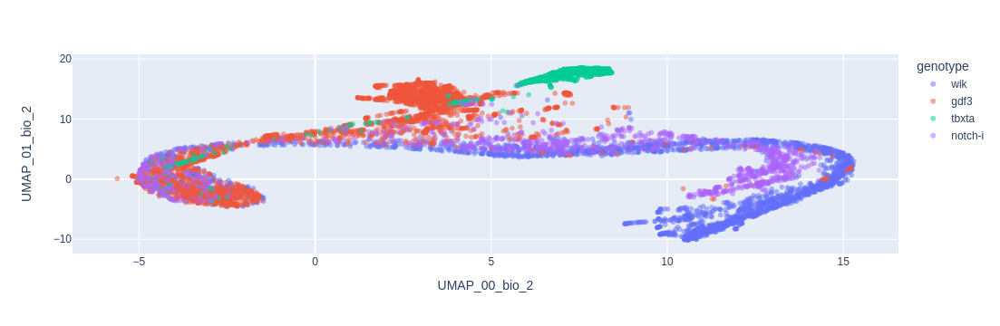

In [25]:
color_var="master_perturbation"
marker_size=6
marker_opacity=0.1
angle=0

perturbations_to_plot = np.asarray(["wik_ref", "gdf3", "notch-i", "tbxta"])
pert_vec = umap_df["master_perturbation_ref"].to_numpy()
plot_indices = np.isin(pert_vec, perturbations_to_plot)

fig = px.scatter(umap_df.loc[plot_indices], x="UMAP_00_bio_2", y="UMAP_01_bio_2",
                            color=color_var, opacity=0.5,
                            labels={'predicted_stage_hpf': "age (hpf)",
                                    'master_perturbation': "genotype"},
                           hover_data=["snip_id"])
        
fig.update_traces(marker={'size': marker_size})

fig.update_layout(template="plotly")


za = 0.5
vec = np.asarray([math.cos(angle), math.sin(angle), za])
vec = vec
camera = dict(
    eye=dict(x=vec[0], y=vec[1], z=vec[2]))

fig.update_layout(scene_camera=camera, scene_dragmode='orbit')

fig.update_layout(scene = dict(
                xaxis_title='UMAP 1',
                yaxis_title='UMAP 2',
                zaxis_title='UMAP 3',
                xaxis = dict(showticklabels=False),
                yaxis = dict(showticklabels=False),
                zaxis = dict(showticklabels=False)))

fig.show()

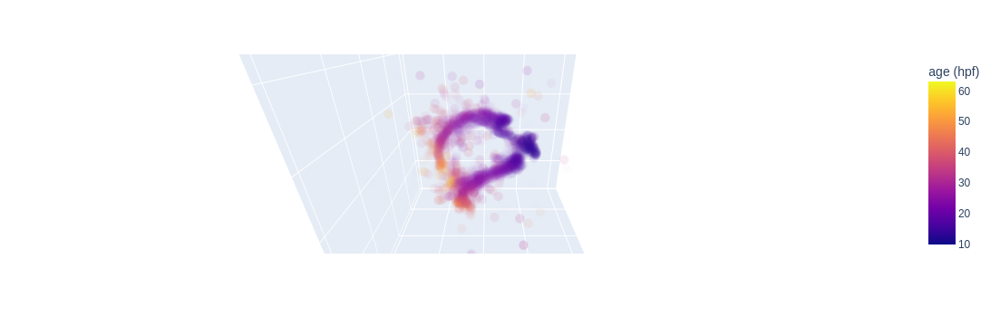

In [6]:
fig = px.scatter_3d(umap_df.loc[wik_indices], x="UMAP_00_3", y="UMAP_01_3", z="UMAP_02_3",
                            color=color_var, opacity=0.005,
                            labels={'predicted_stage_hpf': "age (hpf)",
                                    'master_perturbation': "genotype"},  hover_data=["snip_id"])
        
fig.update_traces(marker={'size': marker_size})

fig.update_layout(template="plotly")


za = 0.5
vec = np.asarray([math.cos(angle), math.sin(angle), za])
vec = vec
camera = dict(
    eye=dict(x=vec[0], y=vec[1], z=vec[2]))

fig.update_layout(scene_camera=camera, scene_dragmode='orbit')

fig.update_layout(scene = dict(
                xaxis_title='UMAP 1',
                yaxis_title='UMAP 2',
                zaxis_title='UMAP 3',
                xaxis = dict(showticklabels=False),
                yaxis = dict(showticklabels=False),
                zaxis = dict(showticklabels=False)))

fig.show()

In [ ]:
from sklearn.svm import OneClassSVM

X = umap_df.loc[:, ["UMAP_00_3", "UMAP_01_3", "UMAP_02_3"]].to_numpy()
clf = OneClassSVM(gamma='auto').fit(X)
umap_df["outlier_flags"] = clf.predict(X)

In [ ]:
fig = px.scatter_3d(umap_df.loc[wik_indices], x="UMAP_00_3", y="UMAP_01_3", z="UMAP_02_3",
                            color="outlier_flags", opacity=0.05,
                            labels={'predicted_stage_hpf': "age (hpf)",
                                    'master_perturbation': "genotype"})
        
fig.update_traces(marker={'size': marker_size})

fig.update_layout(template="plotly")


za = 0.5
vec = np.asarray([math.cos(angle), math.sin(angle), za])
vec = vec
camera = dict(
    eye=dict(x=vec[0], y=vec[1], z=vec[2]))

fig.update_layout(scene_camera=camera, scene_dragmode='orbit')

fig.update_layout(scene = dict(
                xaxis_title='UMAP 1',
                yaxis_title='UMAP 2',
                zaxis_title='UMAP 3',
                xaxis = dict(showticklabels=False),
                yaxis = dict(showticklabels=False),
                zaxis = dict(showticklabels=False)))

fig.show()

In [ ]:
import math
from tqdm import tqdm

def make_rotating_figure(plot_df, angle_vec, frame_dir, marker_opacity=0.5, marker_size=6, color_var=None):

    if color_var is None:
        color_var = "predicted_stage_hpf"
        
    for iter_i, a in enumerate(tqdm(angle_vec)):
        angle = a
        za = 0.3
        vec = np.asarray([math.cos(angle), math.sin(angle), za])
        vec = vec*2
        camera = dict(
            eye=dict(x=vec[0], y=vec[1], z=vec[2]))
        
        fig = px.scatter_3d(plot_df, x="UMAP_00_bio_3", y="UMAP_01_bio_3", z="UMAP_02_bio_3",
                            color=color_var, opacity=marker_opacity,
                            labels={'predicted_stage_hpf': "age (hpf)",
                                    'master_perturbation': "genotype"})
        
        fig.update_traces(marker={'size': marker_size})
        
        fig.update_layout(template="plotly")

        fig.update_layout(scene_camera=camera, scene_dragmode='orbit')

        fig.update_layout(scene = dict(
                        xaxis_title='UMAP 1',
                        yaxis_title='UMAP 2',
                        zaxis_title='UMAP 3',
                        xaxis = dict(showticklabels=False),
                        yaxis = dict(showticklabels=False),
                        zaxis = dict(showticklabels=False)))

#         fig.update_layout(coloraxis_showscale=False)
        
#         fig.update_layout(
#                 scene=dict(aspectratio=dict(x=1, y=1, z=1))
#         )

        fig.write_image(os.path.join(frame_dir, "umap_scatter" + "_" + color_var + f"_{iter_i:03}" + ".png"), scale=2)
            
    return fig

In [ ]:
angle_vec = np.linspace(1.25*np.pi, 3.25*np.pi, 25)
frame_dir = os.path.join(figure_path, "hpf_umap_frames", "")
if not os.path.isdir(frame_dir):
    os.makedirs(frame_dir)
    
fig = make_rotating_figure(umap_df.iloc[wik_indices], angle_vec, frame_dir)
fig.show()

In [ ]:
frame_dir

In [ ]:
# look at the umap
fig = px.scatter_3d(umap_df.iloc[wik_indices], x="UMAP_00_bio_3", y="UMAP_01_bio_3", z="UMAP_02_bio_3",
                         color='predicted_stage_hpf', opacity=0.5,
                         template="plotly")


# fig.update_layout(
#                 xaxis_title="UMAP 1",
#                 yaxis_title="UMAP 2"
#             )
fig.update_traces(
    marker=dict(size=6)
    )


fig.show()
# fig.write_image(os.path.join(out_figure_path, "UMAP_wt_scatter_bio.png"))

In [ ]:
import plotly.graph_objects as go

fig = px.scatter_3d(umap_df.iloc[wik_indices], x="UMAP_00_bio_3", y="UMAP_01_bio_3", z="UMAP_02_bio_3",
                         opacity=0.5,
                         template="plotly")

fig.add_trace(go.Scatter3d(x=umap_df.loc[gdf3_indices, "UMAP_00_bio_3"],
                           y=umap_df.loc[gdf3_indices, "UMAP_01_bio_3"],
                           z=umap_df.loc[gdf3_indices, "UMAP_02_bio_3"],
                           mode="markers", 
                           marker=dict(opacity=0.5)))


fig.update_traces(
    marker=dict(size=6)
    )


fig.show()

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Histogram(x=metric_df.loc[:, "euc_bio_rand"], name="euc_bio_rand")])
fig.add_trace(go.Histogram(x=metric_df.loc[:, "euc_bio"], name="euc_bio"))

fig.add_trace(go.Histogram(x=metric_df.loc[:, "euc_nbio_rand"], name="euc_nbio_rand"))
fig.add_trace(go.Histogram(x=metric_df.loc[:, "euc_nbio"], name="euc_nbio"))

fig.show()